In [2]:
from IPython import get_ipython
from IPython.display import display

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pip install tensorflow


# **Exploring the Data**

In [5]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import VGG16, VGG19, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization


In [6]:
train_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train'
test_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test'
val_dir = '/content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation'


# Check folder existence
for dir_path in [train_dir, test_dir, val_dir]:
    print(" Found:" if os.path.exists(dir_path) else " Not Found:", dir_path)

 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train
 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test
 Found: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation


In [7]:
def count_images_in_subfolders(parent_dir):
    print(f"\n Scanning: {parent_dir}")

    if not os.path.exists(parent_dir):
        print(" Directory not found!")
        return

    for subfolder in sorted(os.listdir(parent_dir)):
        sub_path = os.path.join(parent_dir, subfolder)
        if os.path.isdir(sub_path):
            image_count = len([
                f for f in os.listdir(sub_path)
                if os.path.isfile(os.path.join(sub_path, f))
            ])
            print(f"    {subfolder}: {image_count} images")

# Use your corrected paths
print(" TRAIN DATA")
count_images_in_subfolders(train_dir)

print("\n TEST DATA")
count_images_in_subfolders(test_dir)

print("\n VALIDATION DATA")
count_images_in_subfolders(val_dir)


 TRAIN DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Train/Train
    Healthy: 458 images
    Powdery: 430 images
    Rust: 434 images

 TEST DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Test/Test
    Healthy: 50 images
    Powdery: 50 images
    Rust: 50 images

 VALIDATION DATA

 Scanning: /content/drive/MyDrive/Image_Processing_lab/Project_Plant_leaf_detection/Validation/Validation
    Healthy: 20 images
    Powdery: 20 images
    Rust: 20 images


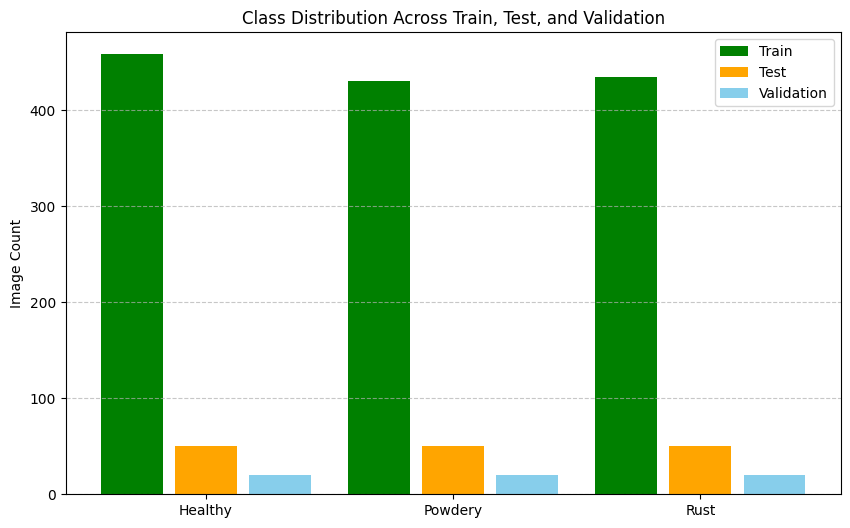

In [8]:
import matplotlib.pyplot as plt


labels = ['Healthy', 'Powdery', 'Rust']
train_counts = [458, 430, 434]
test_counts = [50, 50, 50]
val_counts = [20, 20, 20]

x = range(len(labels))

plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(x, train_counts, width=0.25, label='Train', color='green', align='center')
plt.bar([i + 0.3 for i in x], test_counts, width=0.25, label='Test', color='orange')
plt.bar([i + 0.6 for i in x], val_counts, width=0.25, label='Validation', color='skyblue')

plt.xticks([i + 0.3 for i in x], labels)
plt.ylabel('Image Count')
plt.title('Class Distribution Across Train, Test, and Validation')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# **Data Augmentation**

In [9]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

In [44]:
def load_dataset(directory, augment=False):
    ds = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        image_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        shuffle=True,
        seed=SEED
    )
    class_names = ds.class_names

    if augment:
        aug = tf.keras.Sequential([
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.RandomFlip("horizontal"),
            tf.keras.layers.RandomRotation(0.2),
            tf.keras.layers.RandomZoom(0.2),
            tf.keras.layers.RandomContrast(0.2)
        ])
        ds = ds.map(lambda x, y: (aug(x), y))
    else:
        ds = ds.map(lambda x, y: (x / 255.0, y))

    return ds.prefetch(tf.data.AUTOTUNE), class_names

train_ds, class_names = load_dataset(train_dir, augment=True)
val_ds, _ = load_dataset(val_dir)
test_ds, _ = load_dataset(test_dir)
# class_names is now defined
print("Classes:", class_names)

Found 1322 files belonging to 3 classes.
Found 60 files belonging to 3 classes.
Found 150 files belonging to 3 classes.
Classes: ['Healthy', 'Powdery', 'Rust']


In [42]:
# Compute class weights
def compute_class_weights(directory):
    count = {}
    for cls in os.listdir(directory):
        cls_path = os.path.join(directory, cls)
        count[cls] = len(os.listdir(cls_path))
    total = sum(count.values())
    class_weights = {i: total / (len(count) * count[c]) for i, c in enumerate(sorted(count))}
    return class_weights

class_weights = compute_class_weights(train_dir)

# **Basic CNN**

In [ ]:
# --- BASIC CNN ---
def build_basic_cnn(num_classes):
    inputs = tf.keras.Input((*IMG_SIZE, 3))
    x = tf.keras.layers.Conv2D(32, 3, activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:

model = build_basic_cnn(len(class_names))
model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,347 (42.61 MB)

 Trainable params: 11,169,347 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
)


Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.6923 - loss: 0.6141 - val_accuracy: 0.7500 - val_loss: 0.4542
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.8621 - loss: 0.3794 - val_accuracy: 0.9167 - val_loss: 0.2774
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.9049 - loss: 0.2791 - val_accuracy: 0.9000 - val_loss: 0.2778
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9104 - loss: 0.2514 - val_accuracy: 0.7667 - val_loss: 0.6567
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9130 - loss: 0.3050 - val_accuracy: 0.9333 - val_loss: 0.2827
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.9100 - loss: 0.2530 - val_accuracy: 0.8333 - val_loss: 0.3999
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.9235 - loss: 0.2340 - val_accuracy: 0.9500 - val_loss: 0.2221
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.9191 - loss: 0.2403 - val_accuracy: 0.8833 - val_loss:

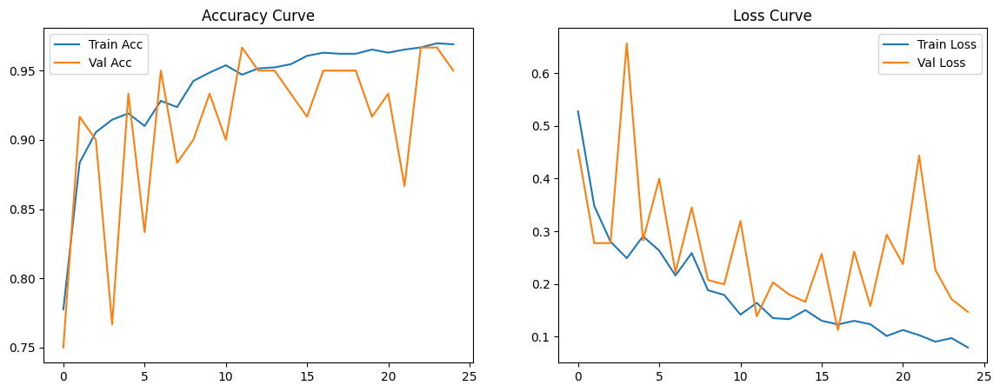

In [ ]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
              precision    recall  f1-score   support

     Healthy       0.87      0.96      0.91        50
     Powdery       0.96      0.88      0.92        50
        Rust       1.00      0.98      0.99        50

    accuracy                           0.94       150
   macro avg       0.94      0.94      0.94       150
weighted avg       0.94      0.94      0.94       150



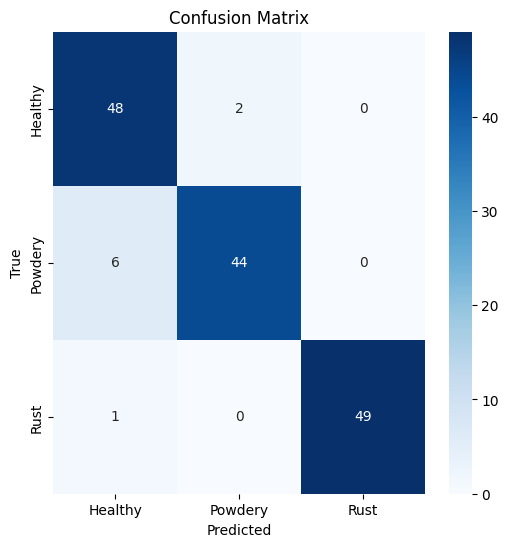

In [ ]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [ ]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9501 - loss: 0.1962
 Test Accuracy: 94.00%
 Test Loss: 0.2343


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


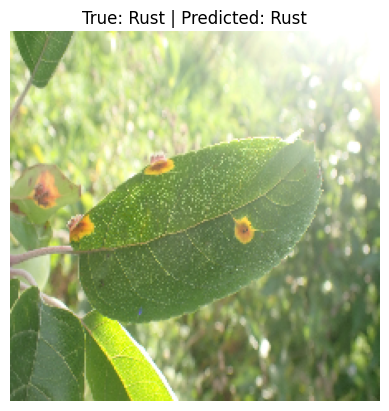

In [ ]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


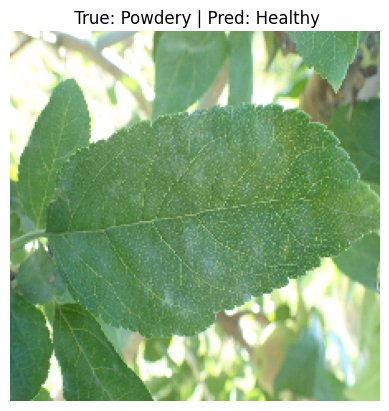

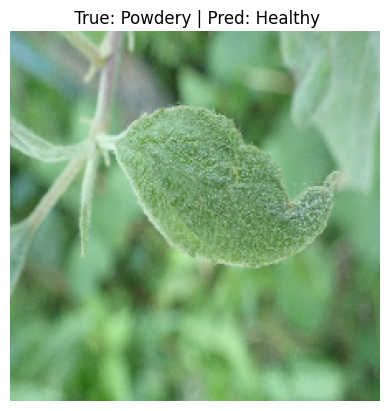

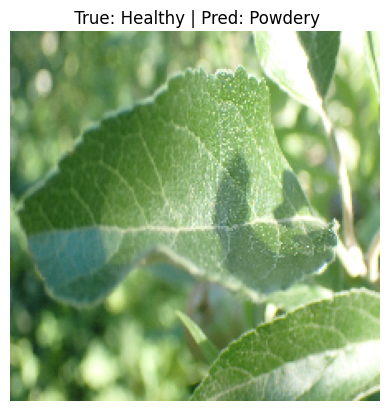

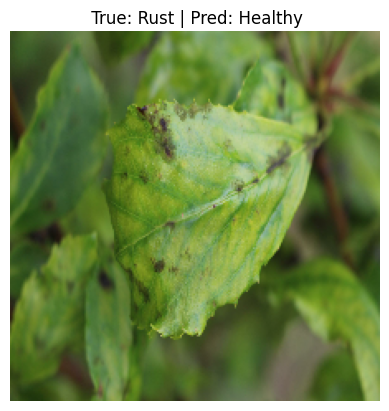

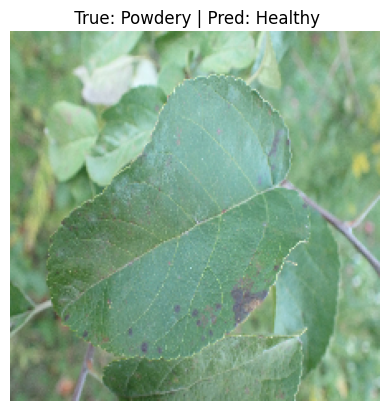

In [ ]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()


# VGG16 Model

In [ ]:
def build_vgg16_model(num_classes):
    base_model = VGG16(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = build_vgg16_model(len(class_names))
model.summary()


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,780,739 (56.38 MB)

 Trainable params: 66,051 (258.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
)


Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.3762 - loss: 1.1293 - val_accuracy: 0.7333 - val_loss: 0.8305
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.6031 - loss: 0.8721 - val_accuracy: 0.7500 - val_loss: 0.6858
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.6714 - loss: 0.7588 - val_accuracy: 0.7000 - val_loss: 0.6562
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.6964 - loss: 0.7114 - val_accuracy: 0.7833 - val_loss: 0.5390
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.7078 - loss: 0.6605 - val_accuracy: 0.8500 - val_loss: 0.5253
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7052 - loss: 0.6629 - val_accuracy: 0.8167 - val_loss: 0.4875
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7516 - loss: 0.6136 - val_accuracy: 0.8667 - val_loss: 0.4499
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.7432 - loss: 0.6071 - val_accuracy: 0.8000 - val_loss:

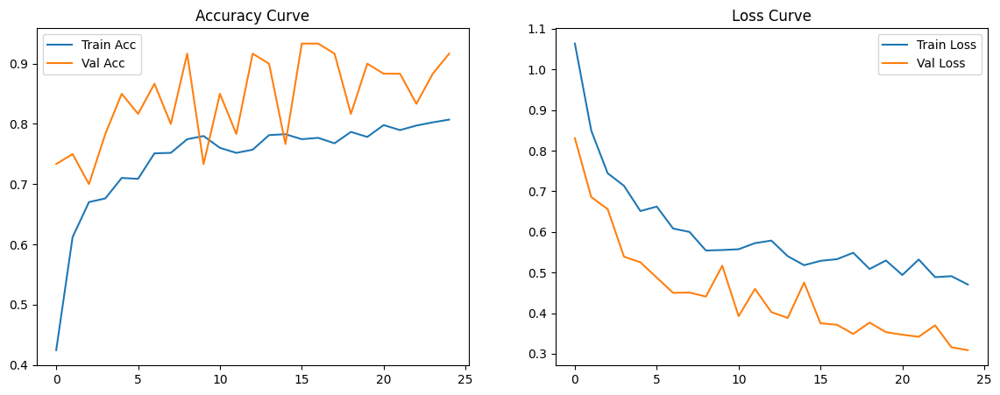

In [ ]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
              precision    recall  f1-score   support

     Healthy       0.85      0.88      0.86        50
     Powdery       0.92      0.88      0.90        50
        Rust       0.82      0.82      0.82        50

    accuracy                           0.86       150
   macro avg       0.86      0.86      0.86       150
weighted avg       0.86      0.86      0.86       150



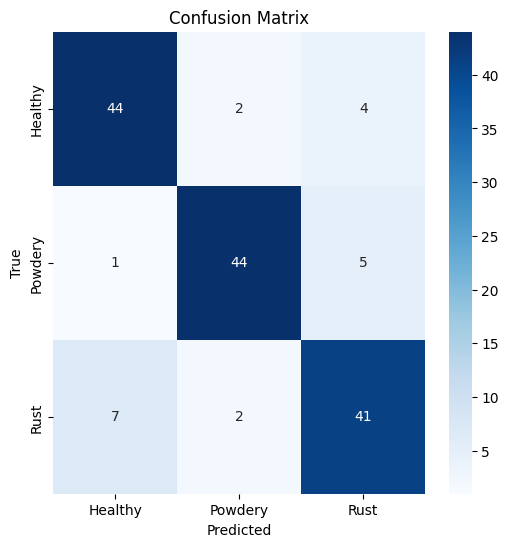

In [ ]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [ ]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.8674 - loss: 0.3951
 Test Accuracy: 86.00%
 Test Loss: 0.4180


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


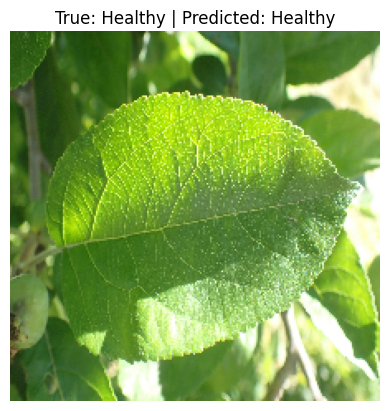

In [ ]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


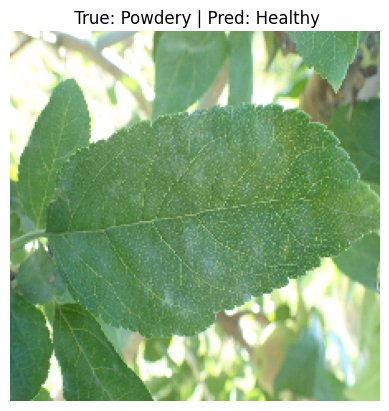

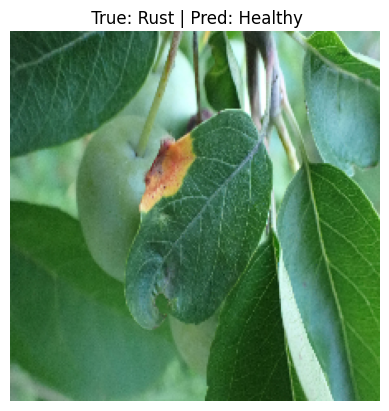

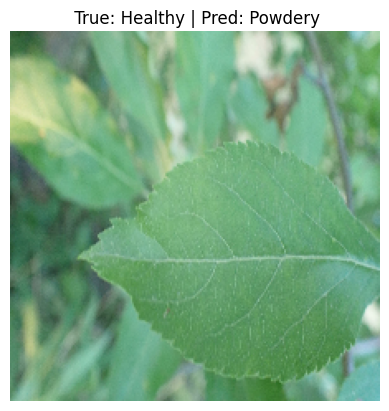

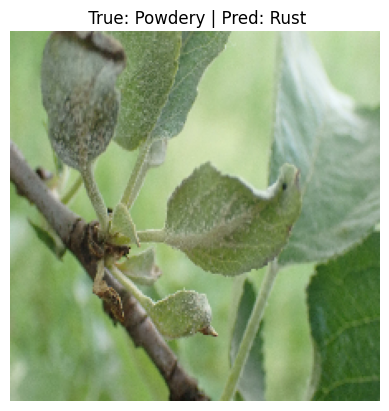

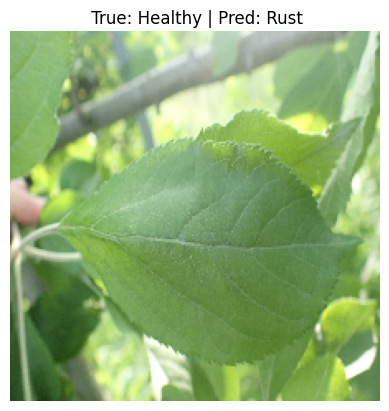

In [ ]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# VGG19 Model

In [ ]:
def build_vgg19_model(num_classes):
    base_model = VGG19(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_vgg19_model(len(class_names))
model.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,090,435 (76.64 MB)

 Trainable params: 66,051 (258.01 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.3406 - loss: 1.2390 - val_accuracy: 0.6833 - val_loss: 0.9384
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.5331 - loss: 0.9801 - val_accuracy: 0.7667 - val_loss: 0.8181
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - accuracy: 0.5961 - loss: 0.8769 - val_accuracy: 0.8167 - val_loss: 0.6913
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.6221 - loss: 0.8445 - val_accuracy: 0.7167 - val_loss: 0.6871
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.6707 - loss: 0.7559 - val_accuracy: 0.8667 - val_loss: 0.5592
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.6655 - loss: 0.7491 - val_accuracy: 0.7833 - val_loss: 0.5385
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - accuracy: 0.7170 - loss: 0.6949 - val_accuracy: 0.8167 - val_loss: 0.5502
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.6911 - loss: 0.6882 - val_accuracy: 0.8333 - val_loss:

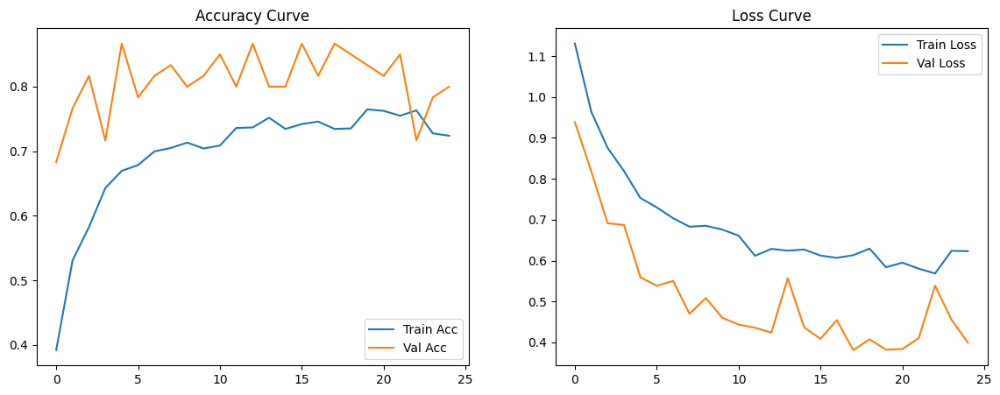

In [ ]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
              precision    recall  f1-score   support

     Healthy       0.71      1.00      0.83        50
     Powdery       0.95      0.84      0.89        50
        Rust       0.97      0.70      0.81        50

    accuracy                           0.85       150
   macro avg       0.88      0.85      0.85       150
weighted avg       0.88      0.85      0.85       150



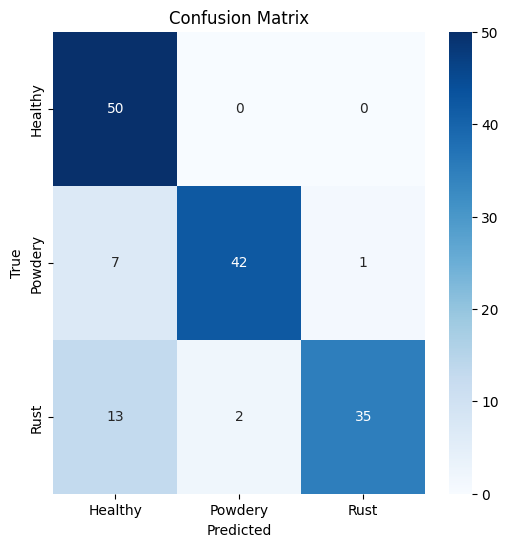

In [ ]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [ ]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.8660 - loss: 0.4534
 Test Accuracy: 84.67%
 Test Loss: 0.4753


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


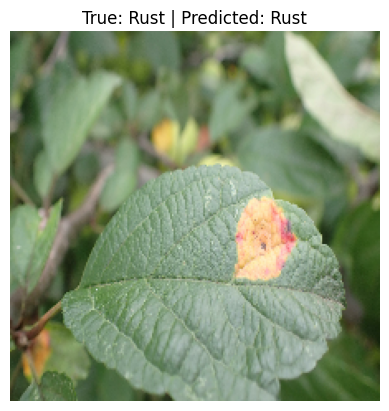

In [ ]:
# Grab one batch from test dataset
import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


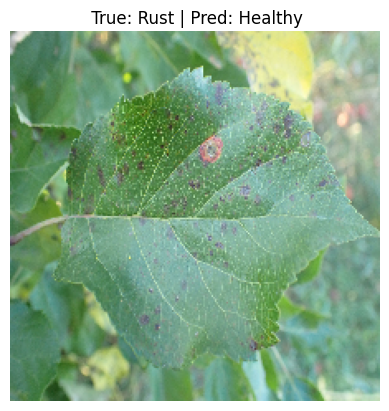

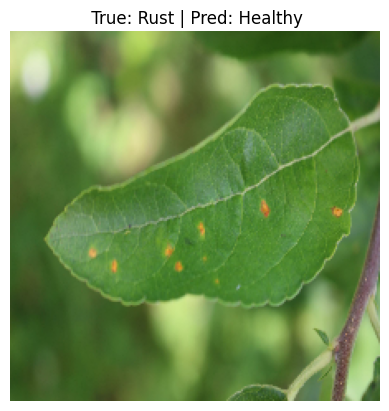

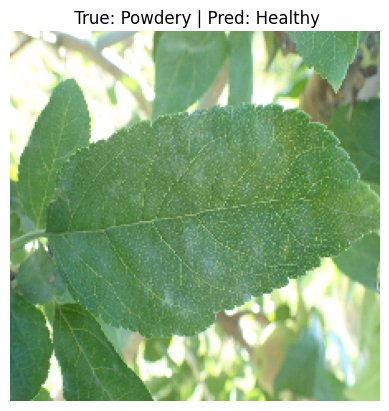

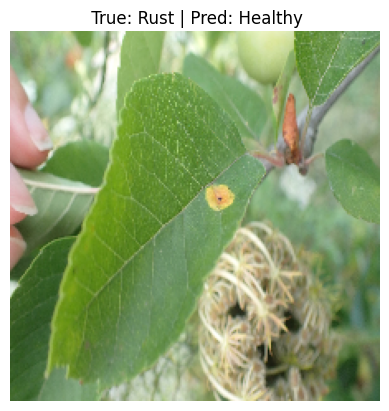

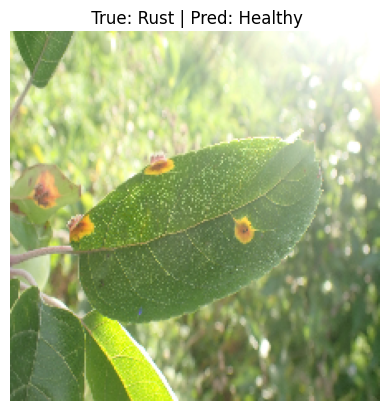

In [ ]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# ResNet50

In [13]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [14]:
def build_resnet50_model(num_classes):
    base_model = ResNet50(include_top=False, weights='imagenet', input_shape=IMG_SIZE + (3,))
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.4)(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = build_resnet50_model(len(class_names))
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,850,883 (90.98 MB)

 Trainable params: 262,915 (1.00 MB)

 Non-trainable params: 23,587,968 (89.98 MB)

In [15]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 323s 7s/step - accuracy: 0.3336 - loss: 1.4373 - val_accuracy: 0.3333 - val_loss: 1.1459
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.3510 - loss: 1.3392 - val_accuracy: 0.3333 - val_loss: 1.1125
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.3444 - loss: 1.2496 - val_accuracy: 0.3333 - val_loss: 1.1273
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.3696 - loss: 1.2068 - val_accuracy: 0.3333 - val_loss: 1.1096
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3666 - loss: 1.1659 - val_accuracy: 0.3333 - val_loss: 1.1070
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3344 - loss: 1.2317 - val_accuracy: 0.4500 - val_loss: 1.0750
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.3495 - loss: 1.1796 - val_accuracy: 0.4833 - val_loss: 1.0674
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3828 - loss: 1.1280 - val_accuracy: 0.4667 - val_loss

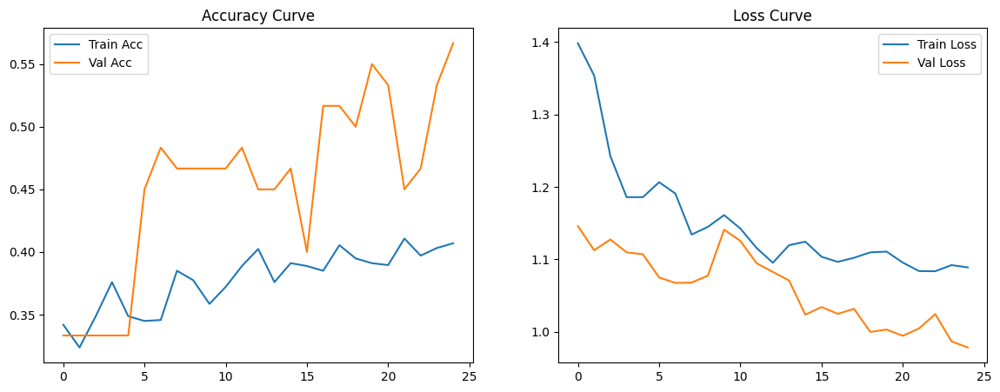

In [16]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
              precision    recall  f1-score   support

     Healthy       0.76      0.32      0.45        50
     Powdery       0.42      0.90      0.57        50
        Rust       0.76      0.32      0.45        50

    accuracy                           0.51       150
   macro avg       0.65      0.51      0.49       150
weighted avg       0.65      0.51      0.49       150



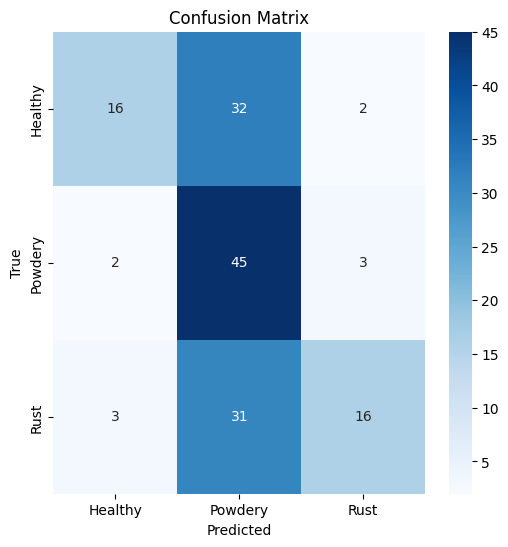

In [17]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [18]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.5001 - loss: 1.0228
 Test Accuracy: 51.33%
 Test Loss: 1.0183


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


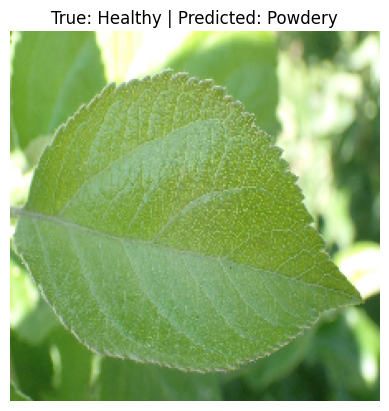

In [19]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


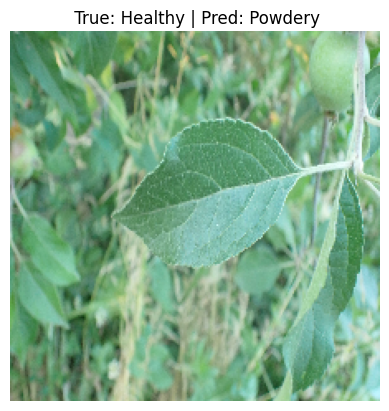

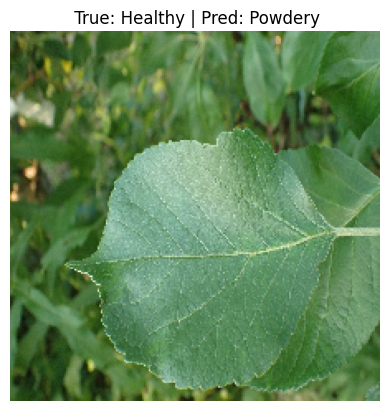

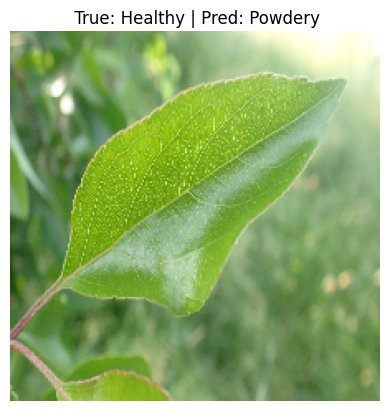

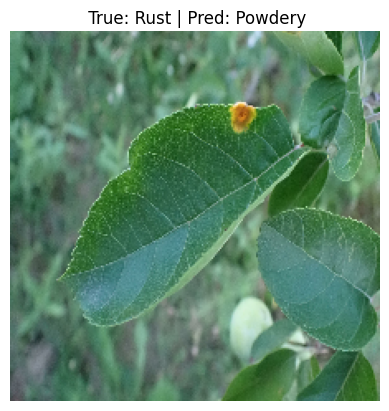

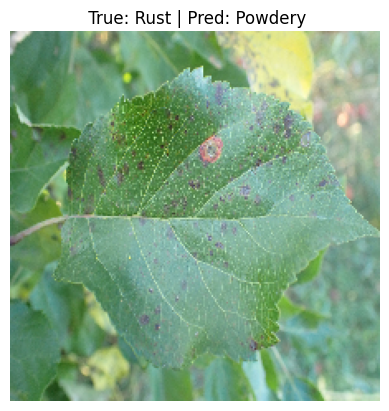

In [20]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)

# Show a few wrong predictions
for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()

# **InseptionResNetV2**

In [29]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

def build_inception_resnet(num_classes):
    base_model = InceptionResNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    base_model.trainable = False  # Freeze base for transfer learning

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Build the model
model = build_inception_resnet(num_classes=len(class_names))
model.summary()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 54,737,123 (208.81 MB)

 Trainable params: 397,315 (1.52 MB)

 Non-trainable params: 54,339,808 (207.29 MB)

In [30]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
)

Epoch 1/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 156s 3s/step - accuracy: 0.4906 - loss: 1.3823 - val_accuracy: 0.9167 - val_loss: 0.4774
Epoch 2/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.7470 - loss: 0.6759 - val_accuracy: 0.9167 - val_loss: 0.3199
Epoch 3/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.8044 - loss: 0.5860 - val_accuracy: 0.9500 - val_loss: 0.2627
Epoch 4/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.8213 - loss: 0.5217 - val_accuracy: 0.9500 - val_loss: 0.1999
Epoch 5/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.8492 - loss: 0.4117 - val_accuracy: 0.9667 - val_loss: 0.1583
Epoch 6/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.8454 - loss: 0.4313 - val_accuracy: 0.9667 - val_loss: 0.1333
Epoch 7/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.8649 - loss: 0.3687 - val_accuracy: 0.9667 - val_loss: 0.1147
Epoch 8/25
42/42 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.8730 - loss: 0.3550 - val_accuracy: 0.9667 - val_loss

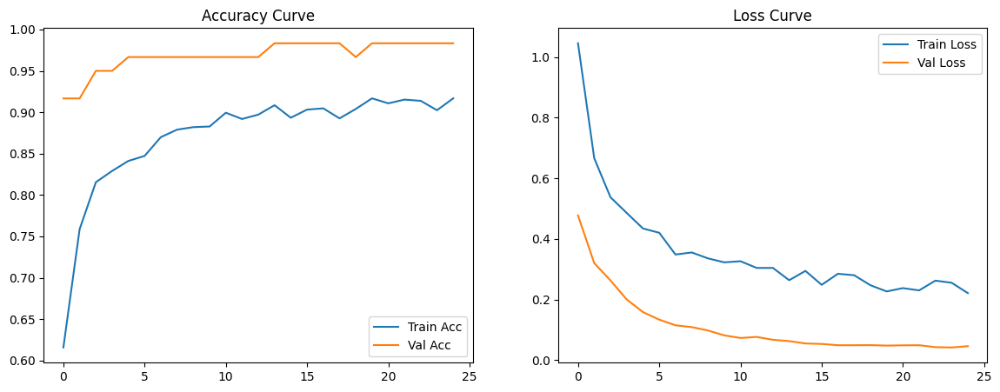

In [31]:
def plot_metrics(history):
    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy Curve")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss Curve")
    plt.legend()

    plt.show()

plot_metrics(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
              precision    recall  f1-score   support

     Healthy       0.92      0.98      0.95        50
     Powdery       0.98      0.92      0.95        50
        Rust       0.96      0.96      0.96        50

    accuracy                           0.95       150
   macro avg       0.95      0.95      0.95       150
weighted avg       0.95      0.95      0.95       150



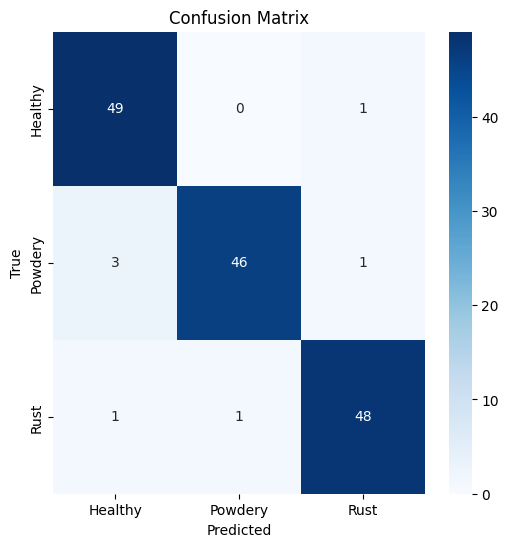

In [32]:
y_true, y_pred = [], []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(preds, axis=1).numpy())

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

In [33]:

test_loss, test_acc = model.evaluate(test_ds)
print(f" Test Accuracy: {test_acc*100:.2f}%")
print(f" Test Loss: {test_loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 0.9445 - loss: 0.2082
 Test Accuracy: 95.33%
 Test Loss: 0.1687


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


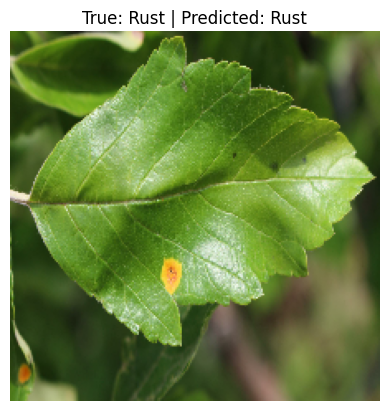

In [34]:

import random

for images, labels in test_ds.take(1):
    idx = random.randint(0, len(images)-1)
    image = images[idx]
    label = tf.argmax(labels[idx]).numpy()

    prediction = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = tf.argmax(prediction[0]).numpy()

    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title(f"True: {class_names[label]} | Predicted: {class_names[predicted_class]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


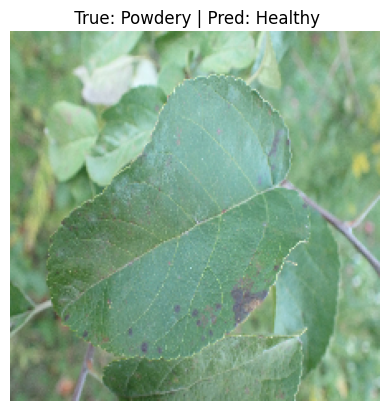

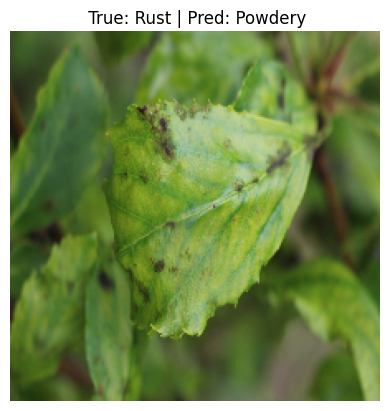

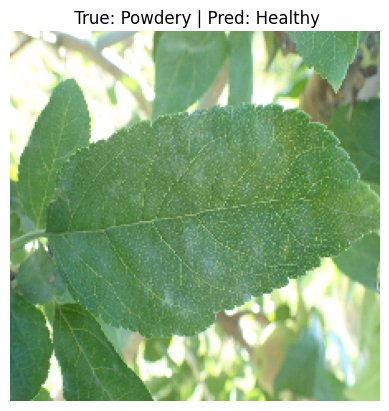

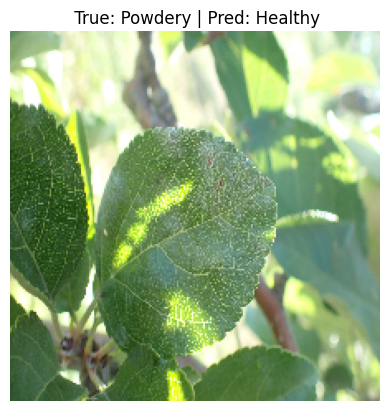

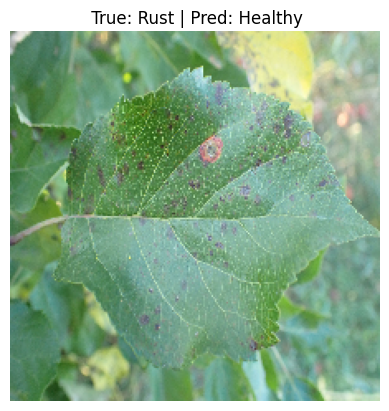

In [35]:
wrong_images = []
wrong_preds = []
wrong_labels = []

for images, labels in test_ds:
    preds = model.predict(images)
    for img, label, pred in zip(images, labels, preds):
        true_cls = tf.argmax(label).numpy()
        pred_cls = tf.argmax(pred).numpy()
        if true_cls != pred_cls:
            wrong_images.append(img)
            wrong_labels.append(true_cls)
            wrong_preds.append(pred_cls)


for i in range(5):
    plt.imshow(wrong_images[i].numpy())
    plt.axis('off')
    plt.title(f" True: {class_names[wrong_labels[i]]} | Pred: {class_names[wrong_preds[i]]}")
    plt.show()